In [1]:
import sys
import os

# Add parent directory to Python path
sys.path.append(os.path.dirname(os.getcwd()))

In [2]:
from utils.Pivots import Pivots
from utils.Quaternions import Quaternions
from pymo.parsers import BVHParser
from pymo.preprocessing import *
from pymo.viz_tools import *
from sklearn.pipeline import Pipeline

In [3]:
parser = BVHParser()

parsed_data = parser.parse("D:/github/motionsynth_data/data/processed/cmu/01_01.bvh")
print_skel(parsed_data)

- Hips (None)
| | - LowerBack (Hips)
| | - Spine (LowerBack)
| | - Spine1 (Spine)
| | | | - RightShoulder (Spine1)
| | | | - RightArm (RightShoulder)
| | | | - RightForeArm (RightArm)
| | | | - RightHand (RightForeArm)
| | | | | - RThumb (RightHand)
| | | | | - RThumb_Nub (RThumb)
| | | | - RightFingerBase (RightHand)
| | | | - RightHandIndex1 (RightFingerBase)
| | | | - RightHandIndex1_Nub (RightHandIndex1)
| | | - LeftShoulder (Spine1)
| | | - LeftArm (LeftShoulder)
| | | - LeftForeArm (LeftArm)
| | | - LeftHand (LeftForeArm)
| | | | - LThumb (LeftHand)
| | | | - LThumb_Nub (LThumb)
| | | - LeftFingerBase (LeftHand)
| | | - LeftHandIndex1 (LeftFingerBase)
| | | - LeftHandIndex1_Nub (LeftHandIndex1)
| | - Neck (Spine1)
| | - Neck1 (Neck)
| | - Head (Neck1)
| | - Head_Nub (Head)
| - RHipJoint (Hips)
| - RightUpLeg (RHipJoint)
| - RightLeg (RightUpLeg)
| - RightFoot (RightLeg)
| - RightToeBase (RightFoot)
| - RightToeBase_Nub (RightToeBase)
- LHipJoint (Hips)
- LeftUpLeg (LHipJoint)
- L

In [4]:
IMPORTANT_JOINTS = [
    'Hips', 'LowerBack', 'Spine', 'Spine1', 'Neck', 'Head',
    'RightShoulder', 'RightArm', 'RightForeArm', 'RightHand',
    'LeftShoulder', 'LeftArm', 'LeftForeArm', 'LeftHand',
    'RightUpLeg', 'RightLeg', 'RightFoot',
    'LeftUpLeg', 'LeftLeg', 'LeftFoot'
]

In [ ]:
import warnings
warnings.filterwarnings("ignore")

data_pipe = Pipeline(
    [
        ("param", MocapParameterizer("position")),
        ("jtsel", JointSelector(IMPORTANT_JOINTS, include_root=False)),
        # ('jtnorm', JointLengthNormalizer()),
        ("dwnsampl", DownSampler(tgt_fps=30, keep_all=False)),
        ("globrm", AutoencoderPreprocess()),
    ]
)
piped_data = data_pipe.fit_transform([parsed_data])

In [6]:
piped_data[0].values

,Hips_Xposition,Hips_Yposition,Hips_Zposition,LowerBack_Xposition,LowerBack_Yposition,LowerBack_Zposition,Spine_Xposition,Spine_Yposition,Spine_Zposition,Spine1_Xposition,...,LeftUpLeg_Zposition,LeftLeg_Xposition,LeftLeg_Yposition,LeftLeg_Zposition,LeftFoot_Xposition,LeftFoot_Yposition,LeftFoot_Zposition,Hips_dXposition,Hips_dZposition,Hips_dYrotation
0 days 00:00:00,-0.434411,17.8693,-0.025348,-0.434411,17.8693,-0.025348,-0.328631,19.902111,-0.221085,-0.294799,...,0.920202,1.167190,8.892477,0.732755,1.515901,1.935360,-2.023624,0.008446,0.011035,-0.001248
0 days 00:00:00.033332,-0.443005,17.8536,-0.048875,-0.443005,17.8536,-0.048875,-0.333975,19.886829,-0.238388,-0.294267,...,0.899134,1.164801,8.886830,0.702680,1.516354,1.926502,-2.045220,-0.011145,-0.007506,-0.001273
0 days 00:00:00.066664,-0.448245,17.8506,-0.068945,-0.448245,17.8506,-0.068945,-0.327736,19.883600,-0.253900,-0.290055,...,0.872225,1.164029,8.860772,0.760702,1.533260,1.914495,-2.020232,-0.014540,0.019746,-0.001296
0 days 00:00:00.099996,-0.428561,17.8470,-0.125397,-0.428561,17.8470,-0.125397,-0.305140,19.881062,-0.296224,-0.264634,...,0.807912,1.181713,8.854080,0.765712,1.551565,1.919901,-2.045171,0.010224,0.031251,-0.001317
0 days 00:00:00.133328,-0.447926,17.8425,-0.190731,-0.447926,17.8425,-0.190731,-0.309287,19.877101,-0.342390,-0.258518,...,0.732731,1.187456,8.850297,0.729826,1.546110,1.911732,-2.071671,0.026610,0.043365,-0.001336
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 00:00:22.732424,-0.118398,17.8798,-0.208685,-0.118398,17.8798,-0.208685,0.001004,19.917205,-0.080048,0.044149,...,0.640396,1.723599,8.993171,1.652462,1.865065,1.846955,-0.590813,0.034372,0.131589,0.006199
0 days 00:00:22.765756,-0.199679,17.8679,-0.291625,-0.199679,17.8679,-0.291625,-0.039253,19.895901,-0.083548,0.049804,...,0.576672,1.685646,9.001877,1.520258,1.843128,1.856970,-0.726119,-0.039625,0.094174,0.006167
0 days 00:00:22.799088,-0.166571,17.8674,-0.264232,-0.166571,17.8674,-0.264232,-0.035634,19.902209,-0.108571,0.023460,...,0.657664,1.608129,8.963262,1.560213,1.852473,1.880371,-0.867468,-0.026078,0.124961,0.006121
0 days 00:00:22.832420,-0.179540,17.8394,-0.289140,-0.179540,17.8394,-0.289140,-0.053298,19.876502,-0.162246,-0.006635,...,0.696122,1.532344,8.933544,1.661863,1.859210,1.936662,-0.994732,-0.027830,0.106264,0.006062


In [7]:
numpyfier = Numpyfier()
piped_data = numpyfier.fit_transform(piped_data)

In [8]:
piped_data.shape

(1, 687, 63)

In [9]:
slicer = Slicer(window_size=160, overlap=0.5)
piped_data = slicer.fit_transform(piped_data)

In [10]:
piped_data.shape

(7, 160, 63)

In [11]:
IMPORTANT_BONES = [
    (0, 1), (1, 2), (2, 3), (3, 4), (4, 5),  # Spine
    (3, 6), (6, 7), (7, 8), (8, 9),          # Left arm  
    (3, 10), (10, 11), (11, 12), (12, 13),   # Right arm
    (0, 14), (14, 15), (15, 16),             # Left leg
    (0, 17), (17, 18), (18, 19)              # Right leg
]

In [12]:
print("First frame joint positions:", piped_data[0, 0, :9])  # First 3 joints

First frame joint positions: [-0.43441085 17.8693     -0.02534837 -0.43441085 17.8693     -0.02534837
 -0.3286313  19.90211076 -0.22108483]


In [13]:
piped_data[0][0]

array([-4.34410845e-01,  1.78693000e+01, -2.53483715e-02, -4.34410845e-01,
        1.78693000e+01, -2.53483715e-02, -3.28631301e-01,  1.99021108e+01,
       -2.21084829e-01, -2.94799237e-01,  2.19513804e+01, -2.67778345e-01,
       -2.94799237e-01,  2.19513804e+01, -2.67778345e-01,  0.00000000e+00,
        2.54017373e+01,  0.00000000e+00, -2.94799237e-01,  2.19513804e+01,
       -2.67778345e-01, -3.47336392e+00,  2.31589437e+01, -8.40955563e-01,
       -3.46378875e+00,  1.79222336e+01, -6.07950942e-01, -3.83129742e+00,
        1.47660511e+01,  7.20866795e-01, -2.94799237e-01,  2.19513804e+01,
       -2.67778345e-01,  3.01623504e+00,  2.33083971e+01, -4.68644566e-01,
        4.86029458e+00,  2.03895170e+01,  3.12438652e+00,  2.94718169e+00,
        2.32971302e+01,  2.97956018e+00, -1.85794868e+00,  1.61877942e+01,
        8.55313511e-01, -1.94559883e+00,  8.76500210e+00,  1.25134673e+00,
       -2.22331694e+00,  1.87618937e+00, -1.72413191e+00,  8.05671774e-01,
        1.60386810e+01,  

In [14]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patheffects as pe
from scipy.spatial.transform import Rotation as R
import numpy as np

In [15]:
def animate_plot(animations):
    # Process data
    processed_animations = []
    for anim in animations[:1]:
        joints = anim[:, :-3].reshape((160, 20, 3))
        root_x, root_z, root_r = anim[:, -3], anim[:, -2], anim[:, -1]
        
        rotation = Quaternions.id(1)
        translation = np.array([[0.0, 0.0, 0.0]])
        
        for i in range(len(joints)):
            joints[i] = rotation * joints[i]
            joints[i, :, 0] = joints[i, :, 0] + translation[0, 0]
            joints[i, :, 2] = joints[i, :, 2] + translation[0, 2]
            
            rotation = Quaternions.from_angle_axis(-root_r[i], np.array([0, 1, 0])) * rotation
            translation = translation + rotation * np.array([root_x[i], 0, root_z[i]])
            
        processed_animations.append(joints)
    
    # Set up plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Get bounds
    all_joints = np.concatenate(processed_animations, axis=0)
    xs, ys, zs = all_joints[:, :, 0], all_joints[:, :, 1], all_joints[:, :, 2]
    ax.set_xlim(xs.min() - 1, xs.max() + 1)
    ax.set_ylim(ys.min() - 1, ys.max() + 1)
    ax.set_zlim(zs.min() - 1, zs.max() + 1)
    
    ax.view_init(elev=45, azim=0, roll=90) 
    # Create scatter plots and bone lines
    scatters = []
    bone_lines = []
    
    for joints in processed_animations:
        # Joint points
        scatter = ax.scatter([], [], [], s=10, c='red')
        scatters.append(scatter)
        
        # Bone connections
        lines = []
        for bone in IMPORTANT_BONES:
            line, = ax.plot([], [], [], 'b-', linewidth=2)
            lines.append(line)
        bone_lines.append(lines)
    
    # Animation function
    def update(frame):
        for i, joints in enumerate(processed_animations):
            # Update joint positions
            scatters[i]._offsets3d = (joints[frame, :, 0], joints[frame, :, 1], joints[frame, :, 2])
            
            # Update bone connections
            for j, (start_joint, end_joint) in enumerate(IMPORTANT_BONES):
                if start_joint < joints.shape[1] and end_joint < joints.shape[1]:
                    x_data = [joints[frame, start_joint, 0], joints[frame, end_joint, 0]]
                    y_data = [joints[frame, start_joint, 1], joints[frame, end_joint, 1]]
                    z_data = [joints[frame, start_joint, 2], joints[frame, end_joint, 2]]
                    
                    bone_lines[i][j].set_data(x_data, y_data)
                    bone_lines[i][j].set_3d_properties(z_data)
        
        ax.set_title(f'Frame {frame}')
        return scatters + [line for lines in bone_lines for line in lines]
    
    # Create animation
    ani = animation.FuncAnimation(fig, update, frames=160, interval=50, repeat=True)
    
    return ani

In [16]:
data = np.load("../data/01_data.npz")
X = data["clips"].astype(np.float64)
sample_idx = np.random.randint(0, X.shape[0])
x_sample = np.expand_dims(X[sample_idx], axis=0)

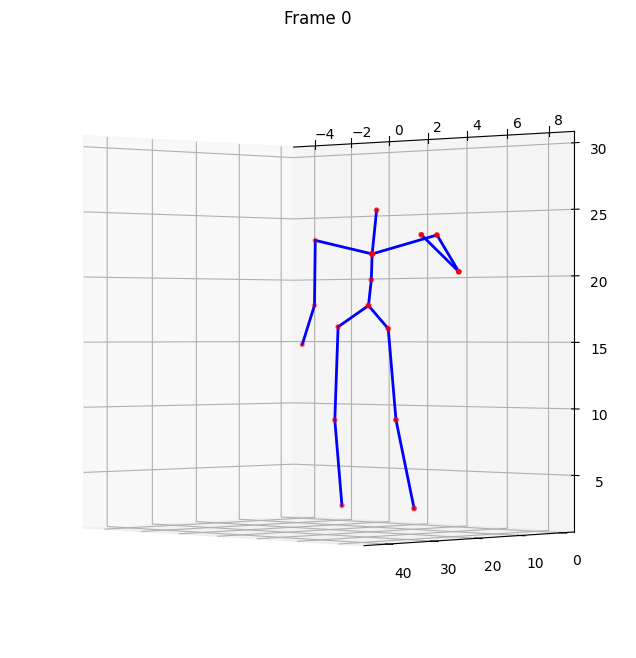

In [17]:
%matplotlib inline
from IPython.display import HTML
# ani = animate_plot(x_sample)
ani = animate_plot(piped_data)
HTML(ani.to_jshtml())

In [18]:
def show_single_frame(data, frame_idx=0):
    """Show one frame with IMPORTANT_BONES bones and joint names"""
    joints = data[0, frame_idx, :60].reshape(20, 3)
    
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot joints as red dots
    ax.scatter(joints[:, 0], joints[:, 1], joints[:, 2], c='red', s=10)
    
    # Add joint names as text labels
    for i, (joint, name) in enumerate(zip(joints, IMPORTANT_JOINTS)):
        ax.text(joint[0], joint[1], joint[2], name, fontsize=8)
    
   # Plot bones as blue lines
    for start, end in IMPORTANT_BONES:
       ax.plot([joints[start, 0], joints[end, 0]], 
               [joints[start, 1], joints[end, 1]], 
               [joints[start, 2], joints[end, 2]], 'b-', linewidth=1)
    
    # Set view to have XZ as horizontal plane and Y as vertical (up)
    ax.view_init(elev=45, azim=0, roll=90)
    
    # Make axes equal for proper proportions
    ax.set_box_aspect([1,1,1])
    
    plt.show()

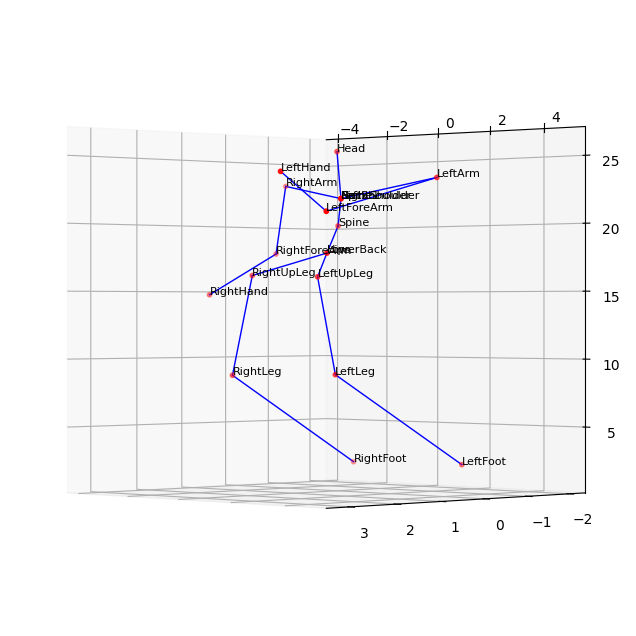

In [19]:
show_single_frame(piped_data)

In [20]:
clips = np.load("../data/01_data.npz")["clips"]
sample_idx = np.random.randint(0, clips.shape[0])

In [21]:
animate_clip = clips[sample_idx]

In [22]:
animate_clip[np.newaxis, :].shape

(1, 160, 63)

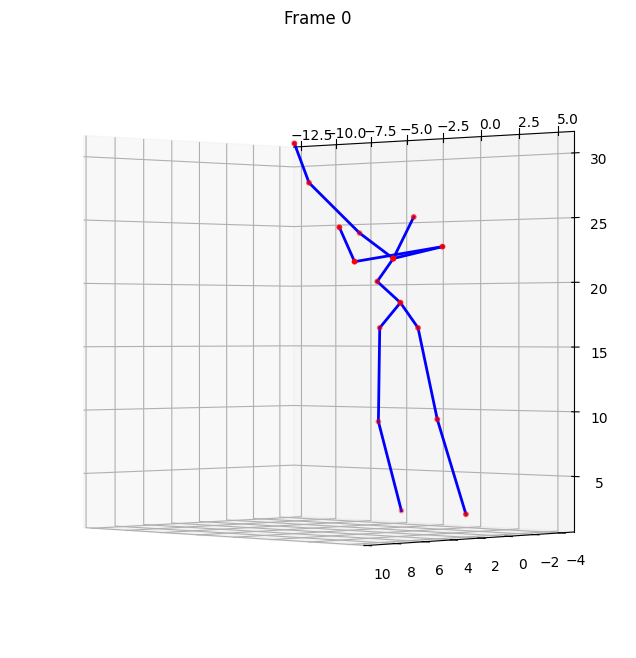

In [23]:
%matplotlib inline
from utils.AnimationPlot import animation_plot
from IPython.display import HTML
ani = animate_plot(animate_clip[np.newaxis, :])
HTML(ani.to_jshtml())

In [24]:
clips = np.load("../data/01_data.npz")["clips"]
clips.shape

(9721, 160, 63)